## Методические указания по выполнению лабораторной работы №4

**Тема: Сегментация объектов с использованием Mask R-CNN**

**Цель работы:** Познакомиться с архитектурой Mask R-CNN и научиться выполнять сегментацию объектов на изображениях.

**Задачи:**

- Изучить теоретические основы instance segmentation.
- Ознакомиться с архитектурой Mask R-CNN.
- Провести инференс предобученной модели на выбранных изображениях.
- Визуализировать результаты: bounding boxes, маски объектов.
- Рассчитать метрики оценки качества масок.
- Проанализировать ошибки сегментации.
- Провести исследование зависимости качества от параметров confidence score и mask threshold.

### 1. Теоретическая часть

В данной лабораторной работе мы познакомимся с задачей детекции на примере архитектуры [Mask R-CNN](https://arxiv.org/pdf/1703.06870), обученной на наборе данных [COCO](https://cocodataset.org/#home), а также с новой задачей компьютерного зрения - сегментацией.

**Перед тем, как приступать к выполнению практической части, ознакомьтесь с первоисточниками используемых компонентов, а также документацией по [ссылке](https://pytorch.org/vision/main/models/mask_rcnn.html), включающей подробности работы с моделью и новым форматом данных, сэмплы кода.**

#### 1.1 Instance Segmentation и архитектура Mask R-CNN

Instance segmentation — это задача, в которой необходимо не только обнаружить объект и его класс, но и сегментировать его границы на уровне пикселей. Это усложнённая версия задачи детекции, так как bounding box не всегда точно соответствует форме объекта.

В отличие от semantic segmentation, где модель выдает одну маску на класс, в instance segmentation выделяется каждый объект независимо, даже если они относятся к одному классу.

Mask R-CNN — это расширение Faster R-CNN, дополненное ещё одним выходом: бинарной маской для каждого обнаруженного объекта.

Архитектура Mask R-CNN включает:

1. Backbone (например, ResNet-50) — извлекает карты признаков из изображения.
2. Region Proposal Network (RPN) — предлагает кандидаты на объекты.
3. ROI Align / ROI Pooling — извлекает фиксированные области из фичей.
4. Bounding Box Head — классифицирует объект и уточняет координаты.
5. Mask Head — предсказывает маску для каждого класса, соответствующую bounding box.


#### 1.2 Формат данных для задачи детекции

При запуске инференса модель возвращает словарь с результатами: координаты bounding boxes, классы объектов, confidence score и маски объектов (представлены как float значения от 0 до 1).

В рамках выполнения работы в зависимости от варианта вам предстоит познакомиться с другими форматами файлов и их содержимым.

### Варианты

Выполните задание в соответствии со своим вариантом по списку с использованием предобученной модели.

**Вариант 1  - Pascal VOC 2007. Сравнить предсказания модели с реальной разметкой и провести количественную оценку:**

- Выполнить инференс модели на 20 изображениях;
- Визуализировать bounding boxes и маски;
- Проанализировать качество предсказаний;
- Описать, какие классы модель распознала, какие пропустила.

**Вариант 2 — COCO 2017. Сравнить предсказания модели с реальной разметкой и провести количественную оценку:**

- Выполнить инференс на 20 изображениях;
- Визуализировать предсказания;
- Сравнить полученные маски с ground truth;
- Рассчитать IoU, Pixel Accuracy или Precision/Recall;

**Вариант 3 — Cityscapes. Проверить, как модель работает на новых изображениях, визуализировать предсказания и сравнить с известными аннотациями:**

- Выполнить инференс на 20 изображениях;
- Визуализировать предсказания;
- Сравнить полученные маски с ground truth;
- Рассчитать IoU, Pixel Accuracy или Precision/Recall;


### 2. Практическая часть

#### 2.1 Подготовка окружения

Установите зависимости и библиотеки:

In [3]:
import torch
import torchvision
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision.transforms import functional as F
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import json
import os
import random
from pycocotools.coco import COCO
from pycocotools import mask as coco_mask

import cv2
from sklearn.metrics import precision_score, recall_score, accuracy_score


#### 2.2 Подготовка модели

Загрузите предобученную модель, определите устройство, переведите модель в режим инференса:

In [4]:
def get_model(num_classes=91):
    # Загрузка модели, предобученной на COCO
    model = maskrcnn_resnet50_fpn(pretrained=True)

    # Перевод модели в режим оценки
    model.eval()
    return model

# Определение устройства (GPU/CPU)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f"Используется устройство: {device}")

# Загрузка модели
model = get_model()
model.to(device)


Используется устройство: cpu


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth


100%|██████████| 170M/170M [00:01<00:00, 147MB/s]


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

#### 2.3 Загрузка и предобработка изображений


Затем импортируйте датасет из соответствующих пакетов PyTorch и определите метод трансформации данных для подачи в модель:

In [8]:
# Создаем директорию для данных
!mkdir -p coco_data

# Загружаем изображения и аннотации
!wget -nc http://images.cocodataset.org/zips/val2017.zip -P coco_data/
!wget -nc http://images.cocodataset.org/annotations/annotations_trainval2017.zip -P coco_data/

# Извлекаем архивы
!unzip -q -o coco_data/val2017.zip -d coco_data/
!unzip -q -o coco_data/annotations_trainval2017.zip -d coco_data/

# Определяем пути к файлам
data_folder = "coco_data"
img_folder = os.path.join(data_folder, "val2017")
annotations_path = os.path.join(data_folder, "annotations", "instances_val2017.json")

# Инициализируем COCO API
coco = COCO(annotations_path)

# Получаем список всех изображений
all_img_ids = coco.getImgIds()
print(f"Общее количество изображений: {len(all_img_ids)}")

# Отбираем 20 случайных изображений
chosen_img_ids = random.sample(all_img_ids, 20)
print(f"Отобрано {len(chosen_img_ids)} изображений для обработки")

# Загружаем информацию о категориях
coco_categories = coco.loadCats(coco.getCatIds())
class_names = [category['name'] for category in coco_categories]
print(f"Всего классов в датасете: {len(class_names)}")


File ‘coco_data/val2017.zip’ already there; not retrieving.

File ‘coco_data/annotations_trainval2017.zip’ already there; not retrieving.

loading annotations into memory...
Done (t=0.86s)
creating index...
index created!
Общее количество изображений: 5000
Отобрано 20 изображений для обработки
Всего классов в датасете: 80


#### 2.4 Предсказания и извлечение масок

Если вы работаете с Pascal VOC, вам потребуется прочитать файлы, содержащие разметку. Если вы работаете с COCO или Cityscapes, аннотации читаются через готовые методы COCO API:

In [9]:
def prepare_image(img_path):
    """Подготовка изображения для нейросети"""
    img = Image.open(img_path).convert("RGB")
    img_tensor = F.to_tensor(img)
    return img_tensor, img

def obtain_predictions(network, img_tensor, device, conf_threshold=0.5):
    """Получение результатов от нейросети"""
    with torch.no_grad():
        output = network([img_tensor.to(device)])
    return output[0]

def filter_results(model_output, conf_threshold=0.5):
    """Отбор результатов по порогу уверенности"""
    filter_mask = model_output['scores'] > conf_threshold
    filtered_output = {}
    for key in model_output:
        filtered_output[key] = model_output[key][filter_mask]
    return filtered_output

def obtain_ground_truth_masks(coco, img_id):
    """Извлечение эталонных масок для снимка"""
    annotation_ids = coco.getAnnIds(imgIds=img_id)
    annotations = coco.loadAnns(annotation_ids)

    true_masks = []
    true_boxes = []
    true_classes = []

    for ann in annotations:
        if 'segmentation' in ann:
            # Конвертация формата COCO в бинарную маску
            rle_obj = coco.annToRLE(ann)
            binary_mask = coco_mask.decode(rle_obj)
            true_masks.append(binary_mask)
            true_boxes.append(ann['bbox'])
            true_classes.append(ann['category_id'])

    return true_masks, true_boxes, true_classes

def compute_iou(mask_a, mask_b):
    """Расчет IoU для двух масок"""
    overlap = np.logical_and(mask_a, mask_b).sum()
    total_area = np.logical_or(mask_a, mask_b).sum()
    return overlap / total_area if total_area > 0 else 0

def get_class_name(class_id, class_mapping):
    """Безопасное получение названия класса"""
    return class_mapping.get(class_id, f'class_{class_id}')

def display_comparison(img, model_output, true_masks=None, true_boxes=None, true_classes=None):
    """Сравнительная визуализация предсказаний и эталонных данных"""
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Конвертация тензора изображения для отображения
    if isinstance(img, torch.Tensor):
        img_display = img.cpu().permute(1, 2, 0).numpy()
    else:
        img_display = np.array(img)

    # Создаем mapping ID класса -> название
    class_mapping = {cat['id']: cat['name'] for cat in coco_categories}

    # Визуализация предсказаний
    pred_img = img_display.copy()

    # Рисуем bounding boxes предсказаний
    if len(model_output['boxes']) > 0:
        bboxes = model_output['boxes'].cpu().numpy()
        conf_scores = model_output['scores'].cpu().numpy()
        class_labels = model_output['labels'].cpu().numpy()

        for idx, (bbox, score, label) in enumerate(zip(bboxes, conf_scores, class_labels)):
            if score > 0.5:  # Показываем только уверенные предсказания
                x1, y1, x2, y2 = bbox.astype(int)
                cv2.rectangle(pred_img, (x1, y1), (x2, y2), (0, 255, 0), 2)

                # Безопасное получение имени класса
                class_name = get_class_name(label, class_mapping)
                cv2.putText(pred_img, f'{class_name}: {score:.2f}',
                           (x1, max(y1-10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    axes[0].imshow(pred_img)
    axes[0].set_title('Предсказания модели')
    axes[0].axis('off')

    # Визуализация ground truth
    gt_img = img_display.copy()
    if true_boxes and true_classes:
        for idx, (bbox, class_id) in enumerate(zip(true_boxes, true_classes)):
            x, y, w, h = [int(coord) for coord in bbox]
            cv2.rectangle(gt_img, (x, y), (x+w, y+h), (255, 0, 0), 2)

            # Безопасное получение имени класса
            class_name = get_class_name(class_id, class_mapping)
            cv2.putText(gt_img, class_name,
                       (x, max(y-10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    axes[1].imshow(gt_img)
    axes[1].set_title('Эталонная разметка')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

# 2.4 Получение предсказаний и масок - функции для извлечения результатов и отображения
def prepare_image(img_path):
    """Подготовка изображения для нейросети"""
    img = Image.open(img_path).convert("RGB")
    img_tensor = F.to_tensor(img)
    return img_tensor, img

def obtain_predictions(network, img_tensor, device, conf_threshold=0.5):
    """Получение результатов от нейросети"""
    with torch.no_grad():
        output = network([img_tensor.to(device)])
    return output[0]

def filter_results(model_output, conf_threshold=0.5):
    """Отбор результатов по порогу уверенности"""
    filter_mask = model_output['scores'] > conf_threshold
    filtered_output = {}
    for key in model_output:
        filtered_output[key] = model_output[key][filter_mask]
    return filtered_output

def obtain_ground_truth_masks(coco, img_id):
    """Извлечение эталонных масок для снимка"""
    annotation_ids = coco.getAnnIds(imgIds=img_id)
    annotations = coco.loadAnns(annotation_ids)

    true_masks = []
    true_boxes = []
    true_classes = []

    for ann in annotations:
        if 'segmentation' in ann:
            # Конвертация формата COCO в бинарную маску
            rle_obj = coco.annToRLE(ann)
            binary_mask = coco_mask.decode(rle_obj)
            true_masks.append(binary_mask)
            true_boxes.append(ann['bbox'])
            true_classes.append(ann['category_id'])

    return true_masks, true_boxes, true_classes

def compute_iou(mask_a, mask_b):
    """Расчет IoU для двух масок"""
    overlap = np.logical_and(mask_a, mask_b).sum()
    total_area = np.logical_or(mask_a, mask_b).sum()
    return overlap / total_area if total_area > 0 else 0

def get_class_name(class_id, class_mapping):
    """Безопасное получение названия класса"""
    return class_mapping.get(class_id, f'class_{class_id}')

def display_comparison(img, model_output, true_masks=None, true_boxes=None, true_classes=None):
    """Сравнительная визуализация предсказаний и эталонных данных"""
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Конвертация тензора изображения для отображения
    if isinstance(img, torch.Tensor):
        img_display = img.cpu().permute(1, 2, 0).numpy()
    else:
        img_display = np.array(img)

    # Создаем mapping ID класса -> название
    class_mapping = {cat['id']: cat['name'] for cat in coco_categories}

    # Визуализация предсказаний
    pred_img = img_display.copy()

    # Рисуем bounding boxes предсказаний
    if len(model_output['boxes']) > 0:
        bboxes = model_output['boxes'].cpu().numpy()
        conf_scores = model_output['scores'].cpu().numpy()
        class_labels = model_output['labels'].cpu().numpy()

        for idx, (bbox, score, label) in enumerate(zip(bboxes, conf_scores, class_labels)):
            if score > 0.5:  # Показываем только уверенные предсказания
                x1, y1, x2, y2 = bbox.astype(int)
                cv2.rectangle(pred_img, (x1, y1), (x2, y2), (0, 255, 0), 2)

                # Безопасное получение имени класса
                class_name = get_class_name(label, class_mapping)
                cv2.putText(pred_img, f'{class_name}: {score:.2f}',
                           (x1, max(y1-10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    axes[0].imshow(pred_img)
    axes[0].set_title('Предсказания модели')
    axes[0].axis('off')

    # Визуализация ground truth
    gt_img = img_display.copy()
    if true_boxes and true_classes:
        for idx, (bbox, class_id) in enumerate(zip(true_boxes, true_classes)):
            x, y, w, h = [int(coord) for coord in bbox]
            cv2.rectangle(gt_img, (x, y), (x+w, y+h), (255, 0, 0), 2)

            # Безопасное получение имени класса
            class_name = get_class_name(class_id, class_mapping)
            cv2.putText(gt_img, class_name,
                       (x, max(y-10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    axes[1].imshow(gt_img)
    axes[1].set_title('Эталонная разметка')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

# 2.4 Получение предсказаний и масок - функции для извлечения результатов и отображения
def prepare_image(img_path):
    """Подготовка изображения для нейросети"""
    img = Image.open(img_path).convert("RGB")
    img_tensor = F.to_tensor(img)
    return img_tensor, img

def obtain_predictions(network, img_tensor, device, conf_threshold=0.5):
    """Получение результатов от нейросети"""
    with torch.no_grad():
        output = network([img_tensor.to(device)])
    return output[0]

def filter_results(model_output, conf_threshold=0.5):
    """Отбор результатов по порогу уверенности"""
    filter_mask = model_output['scores'] > conf_threshold
    filtered_output = {}
    for key in model_output:
        filtered_output[key] = model_output[key][filter_mask]
    return filtered_output

def obtain_ground_truth_masks(coco, img_id):
    """Извлечение эталонных масок для снимка"""
    annotation_ids = coco.getAnnIds(imgIds=img_id)
    annotations = coco.loadAnns(annotation_ids)

    true_masks = []
    true_boxes = []
    true_classes = []

    for ann in annotations:
        if 'segmentation' in ann:
            # Конвертация формата COCO в бинарную маску
            rle_obj = coco.annToRLE(ann)
            binary_mask = coco_mask.decode(rle_obj)
            true_masks.append(binary_mask)
            true_boxes.append(ann['bbox'])
            true_classes.append(ann['category_id'])

    return true_masks, true_boxes, true_classes

def compute_iou(mask_a, mask_b):
    """Расчет IoU для двух масок"""
    overlap = np.logical_and(mask_a, mask_b).sum()
    total_area = np.logical_or(mask_a, mask_b).sum()
    return overlap / total_area if total_area > 0 else 0

def get_class_name(class_id, class_mapping):
    """Безопасное получение названия класса"""
    return class_mapping.get(class_id, f'class_{class_id}')

def display_comparison(img, model_output, true_masks=None, true_boxes=None, true_classes=None):
    """Сравнительная визуализация предсказаний и эталонных данных"""
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Конвертация тензора изображения для отображения
    if isinstance(img, torch.Tensor):
        img_display = img.cpu().permute(1, 2, 0).numpy()
    else:
        img_display = np.array(img)

    # Создаем mapping ID класса -> название
    class_mapping = {cat['id']: cat['name'] for cat in coco_categories}

    # Визуализация предсказаний
    pred_img = img_display.copy()

    # Рисуем bounding boxes предсказаний
    if len(model_output['boxes']) > 0:
        bboxes = model_output['boxes'].cpu().numpy()
        conf_scores = model_output['scores'].cpu().numpy()
        class_labels = model_output['labels'].cpu().numpy()

        for idx, (bbox, score, label) in enumerate(zip(bboxes, conf_scores, class_labels)):
            if score > 0.5:  # Показываем только уверенные предсказания
                x1, y1, x2, y2 = bbox.astype(int)
                cv2.rectangle(pred_img, (x1, y1), (x2, y2), (0, 255, 0), 2)

                # Безопасное получение имени класса
                class_name = get_class_name(label, class_mapping)
                cv2.putText(pred_img, f'{class_name}: {score:.2f}',
                           (x1, max(y1-10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    axes[0].imshow(pred_img)
    axes[0].set_title('Предсказания модели')
    axes[0].axis('off')

    # Визуализация ground truth
    gt_img = img_display.copy()
    if true_boxes and true_classes:
        for idx, (bbox, class_id) in enumerate(zip(true_boxes, true_classes)):
            x, y, w, h = [int(coord) for coord in bbox]
            cv2.rectangle(gt_img, (x, y), (x+w, y+h), (255, 0, 0), 2)

            # Безопасное получение имени класса
            class_name = get_class_name(class_id, class_mapping)
            cv2.putText(gt_img, class_name,
                       (x, max(y-10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    axes[1].imshow(gt_img)
    axes[1].set_title('Эталонная разметка')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()



#### 2.5 Оценка модели и визуализация результатов

Визуализируйте bounding box, название класса, маску поверх изображения. Для каждой маски и её соответствующего ground truth (если имеется), вычислите: IoU, количество FP пикселей, количество FN пикселей:

Обработано категорий: 80
Начальные категории: [(1, 'person'), (2, 'bicycle'), (3, 'car'), (4, 'motorcycle'), (5, 'airplane')]

--- Просмотр изображения 1/20 ---
Изображение: 000000199236.jpg


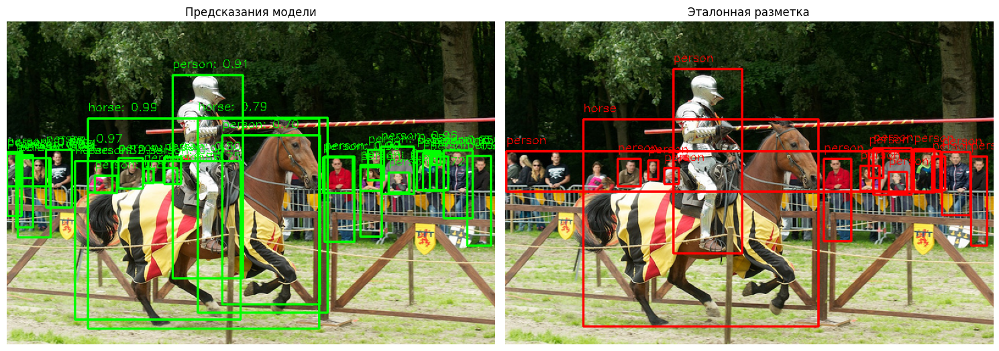

Средние значения: IoU: 0.305, Precision: 0.463, Recall: 0.323
Найдено объектов: 32
Классы прогнозов: ['person', 'horse', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'horse', 'person', 'person', 'horse', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person']
Истинных объектов: 15
Классы разметки: ['horse', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person']

--- Просмотр изображения 2/20 ---
Изображение: 000000344816.jpg


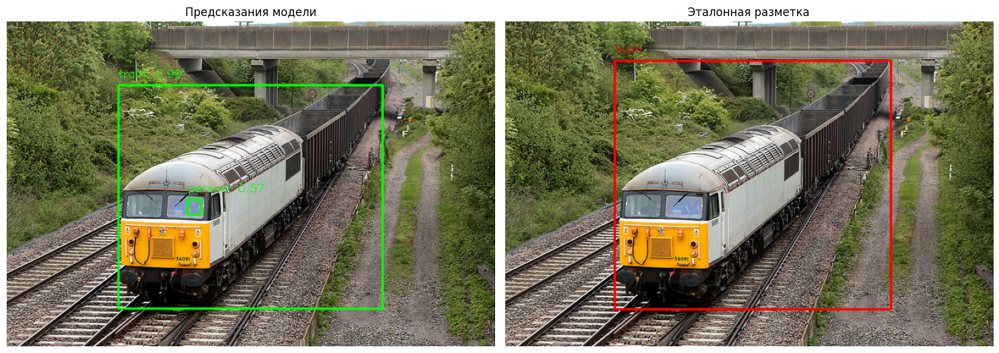

Средние значения: IoU: 0.466, Precision: 0.995, Recall: 0.471
Найдено объектов: 2
Классы прогнозов: ['train', 'person']
Истинных объектов: 1
Классы разметки: ['train']

--- Просмотр изображения 3/20 ---
Изображение: 000000189451.jpg


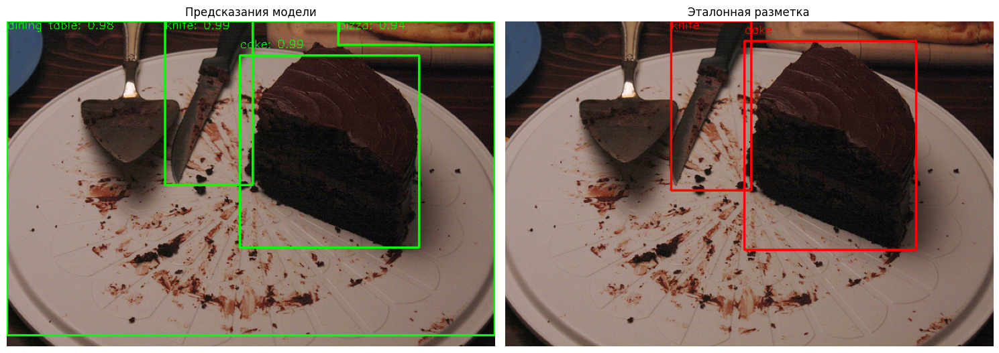

Средние значения: IoU: 0.658, Precision: 0.687, Recall: 0.967
Найдено объектов: 4
Классы прогнозов: ['cake', 'knife', 'dining table', 'pizza']
Истинных объектов: 2
Классы разметки: ['knife', 'cake']

--- Просмотр изображения 4/20 ---
Изображение: 000000434996.jpg


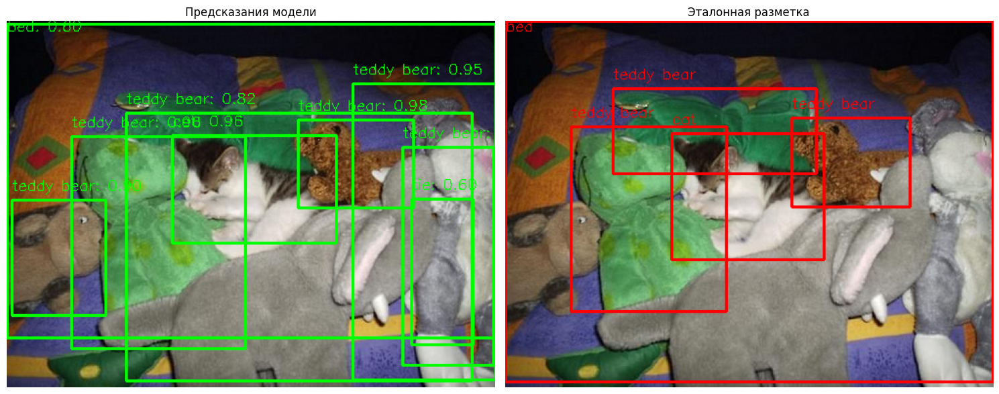

Средние значения: IoU: 0.619, Precision: 0.976, Recall: 0.638
Найдено объектов: 9
Классы прогнозов: ['teddy bear', 'teddy bear', 'cat', 'teddy bear', 'teddy bear', 'teddy bear', 'tie', 'bed', 'teddy bear']
Истинных объектов: 5
Классы разметки: ['cat', 'bed', 'teddy bear', 'teddy bear', 'teddy bear']

--- Просмотр изображения 5/20 ---
Изображение: 000000433103.jpg


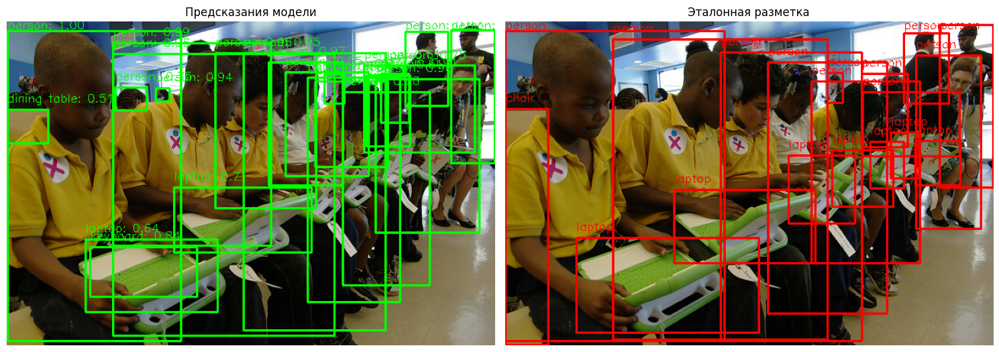

Средние значения: IoU: 0.004, Precision: 0.005, Recall: 0.020
Найдено объектов: 24
Классы прогнозов: ['person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'keyboard', 'person', 'person', 'person', 'person', 'laptop', 'laptop', 'person', 'person', 'person', 'dining table']
Истинных объектов: 19
Классы разметки: ['laptop', 'laptop', 'laptop', 'laptop', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'chair', 'person', 'person', 'laptop', 'laptop', 'person', 'person', 'laptop']

--- Просмотр изображения 6/20 ---
Изображение: 000000423506.jpg


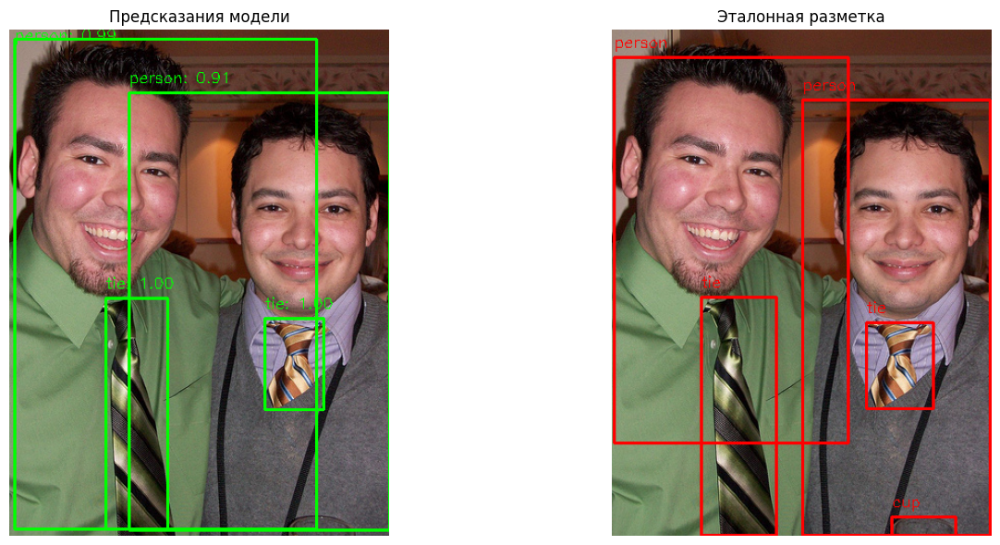

Средние значения: IoU: 0.365, Precision: 0.690, Recall: 0.620
Найдено объектов: 4
Классы прогнозов: ['tie', 'tie', 'person', 'person']
Истинных объектов: 5
Классы разметки: ['tie', 'person', 'cup', 'person', 'tie']

--- Просмотр изображения 7/20 ---
Изображение: 000000193494.jpg


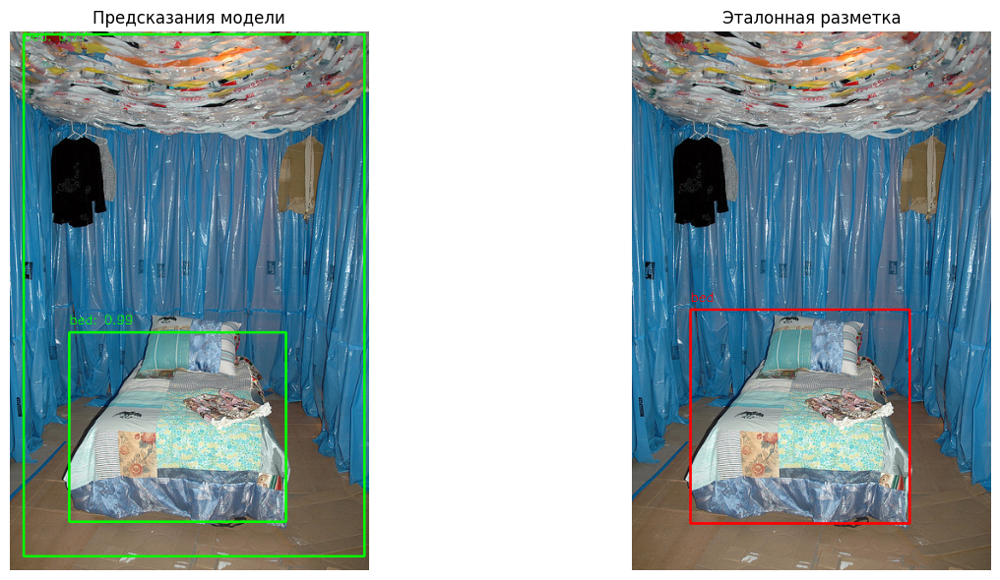

Средние значения: IoU: 0.557, Precision: 0.590, Recall: 0.965
Найдено объектов: 2
Классы прогнозов: ['bed', 'bed']
Истинных объектов: 1
Классы разметки: ['bed']

--- Просмотр изображения 8/20 ---
Изображение: 000000285788.jpg


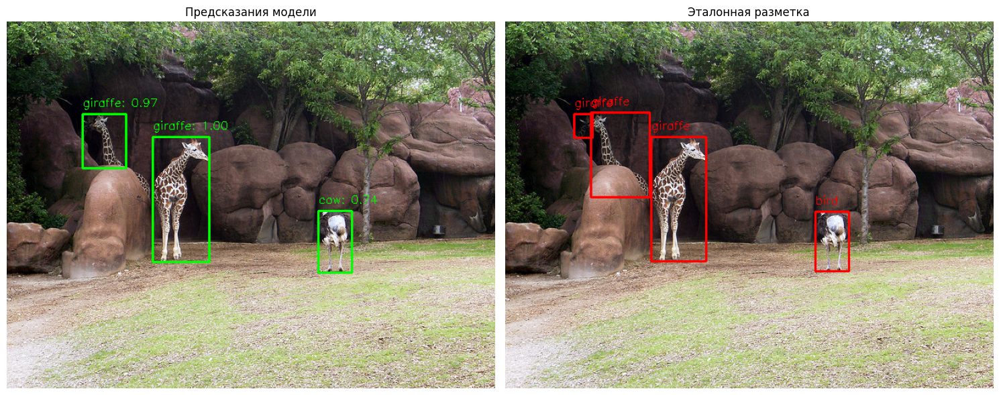

Средние значения: IoU: 0.751, Precision: 0.823, Recall: 0.886
Найдено объектов: 3
Классы прогнозов: ['giraffe', 'giraffe', 'cow']
Истинных объектов: 4
Классы разметки: ['bird', 'giraffe', 'giraffe', 'giraffe']

--- Просмотр изображения 9/20 ---
Изображение: 000000239717.jpg


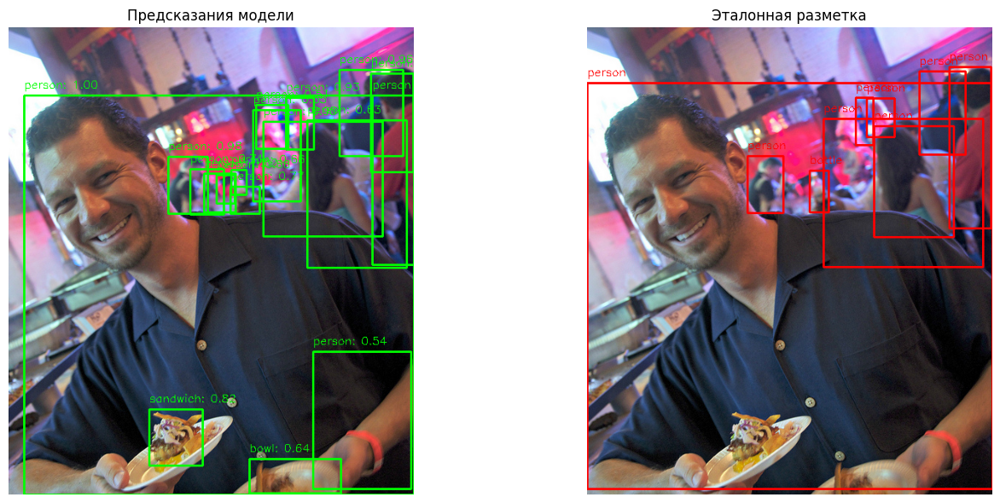

Средние значения: IoU: 0.373, Precision: 0.520, Recall: 0.409
Найдено объектов: 18
Классы прогнозов: ['person', 'person', 'person', 'person', 'person', 'person', 'sandwich', 'person', 'person', 'person', 'person', 'person', 'bowl', 'person', 'person', 'person', 'person', 'person']
Истинных объектов: 9
Классы разметки: ['bottle', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person']

--- Просмотр изображения 10/20 ---
Изображение: 000000381360.jpg


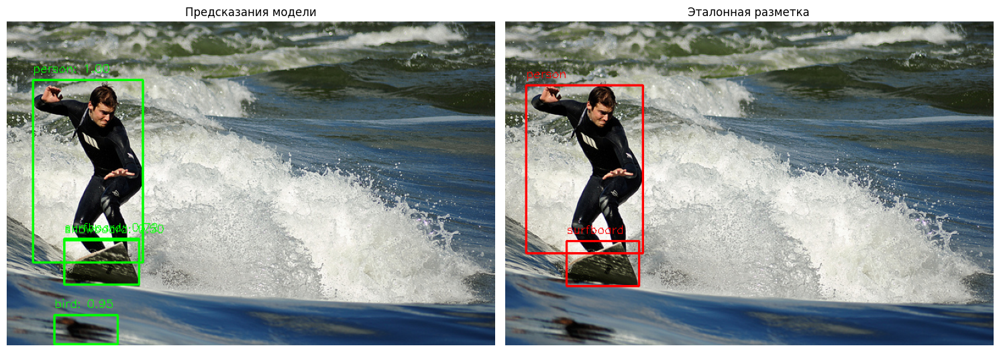

Средние значения: IoU: 0.898, Precision: 0.931, Recall: 0.962
Найдено объектов: 4
Классы прогнозов: ['person', 'bird', 'surfboard', 'snowboard']
Истинных объектов: 2
Классы разметки: ['person', 'surfboard']

--- Просмотр изображения 11/20 ---
Изображение: 000000096001.jpg


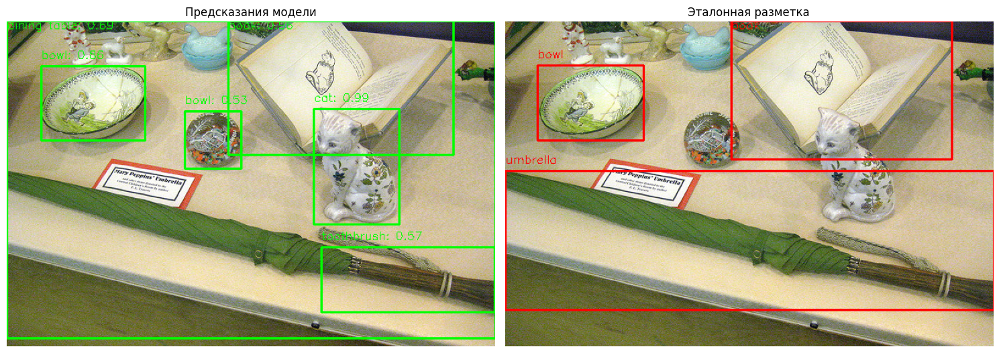

Средние значения: IoU: 0.606, Precision: 0.629, Recall: 0.646
Найдено объектов: 6
Классы прогнозов: ['cat', 'book', 'bowl', 'dining table', 'toothbrush', 'bowl']
Истинных объектов: 3
Классы разметки: ['umbrella', 'book', 'bowl']

--- Просмотр изображения 12/20 ---
Изображение: 000000394940.jpg


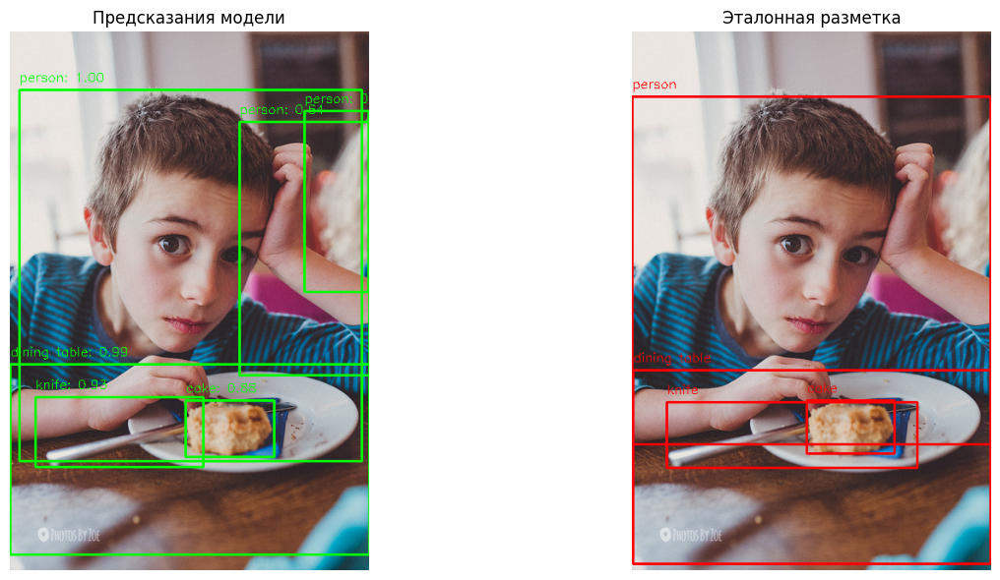

Средние значения: IoU: 0.467, Precision: 0.518, Recall: 0.579
Найдено объектов: 6
Классы прогнозов: ['person', 'dining table', 'knife', 'cake', 'person', 'person']
Истинных объектов: 4
Классы разметки: ['knife', 'cake', 'dining table', 'person']

--- Просмотр изображения 13/20 ---
Изображение: 000000064462.jpg


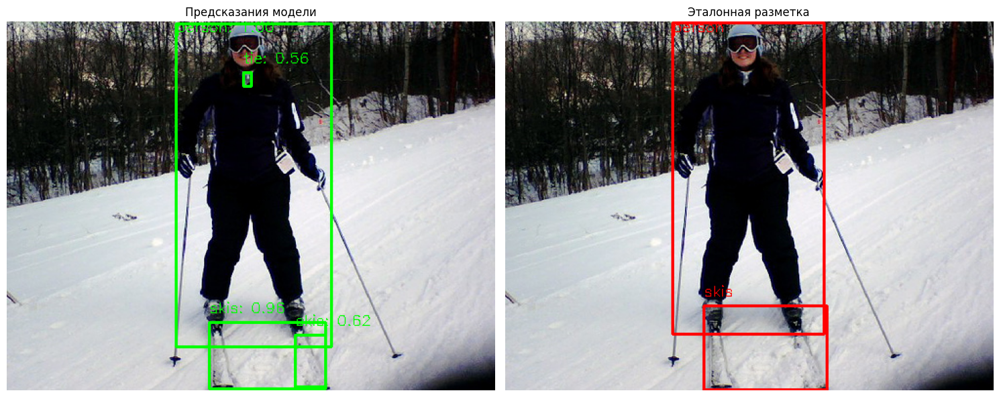

Средние значения: IoU: 0.584, Precision: 0.918, Recall: 0.622
Найдено объектов: 4
Классы прогнозов: ['person', 'skis', 'skis', 'tie']
Истинных объектов: 2
Классы разметки: ['person', 'skis']

--- Просмотр изображения 14/20 ---
Изображение: 000000280710.jpg


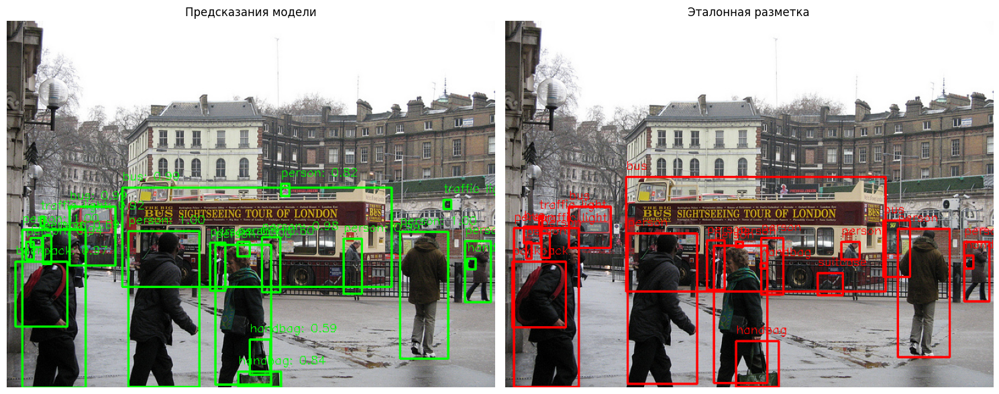

Средние значения: IoU: 0.442, Precision: 0.471, Recall: 0.475
Найдено объектов: 21
Классы прогнозов: ['person', 'person', 'person', 'person', 'person', 'bus', 'bus', 'person', 'person', 'backpack', 'person', 'traffic light', 'person', 'handbag', 'person', 'car', 'person', 'person', 'handbag', 'handbag', 'traffic light']
Истинных объектов: 22
Классы разметки: ['bus', 'bus', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'traffic light', 'traffic light', 'backpack', 'handbag', 'person', 'bus', 'bus', 'handbag', 'suitcase', 'person', 'handbag', 'person']

--- Просмотр изображения 15/20 ---
Изображение: 000000467848.jpg


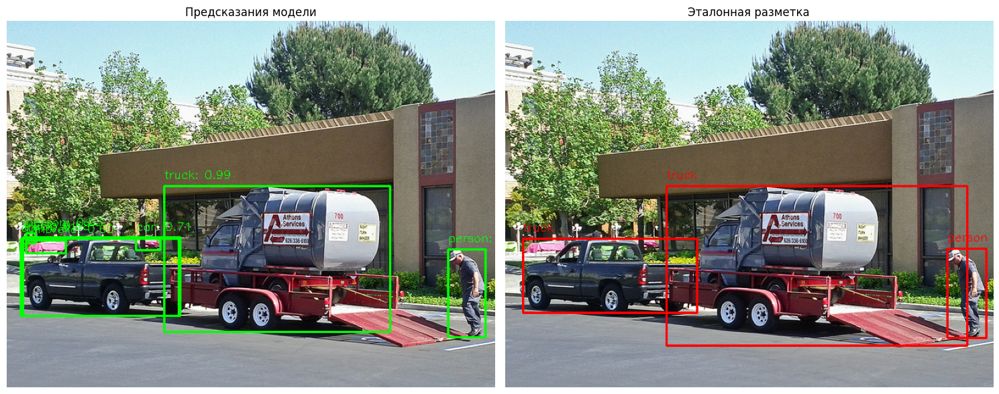

Средние значения: IoU: 0.867, Precision: 0.957, Recall: 0.903
Найдено объектов: 7
Классы прогнозов: ['person', 'truck', 'car', 'car', 'truck', 'umbrella', 'person']
Истинных объектов: 3
Классы разметки: ['truck', 'truck', 'person']

--- Просмотр изображения 16/20 ---
Изображение: 000000136715.jpg


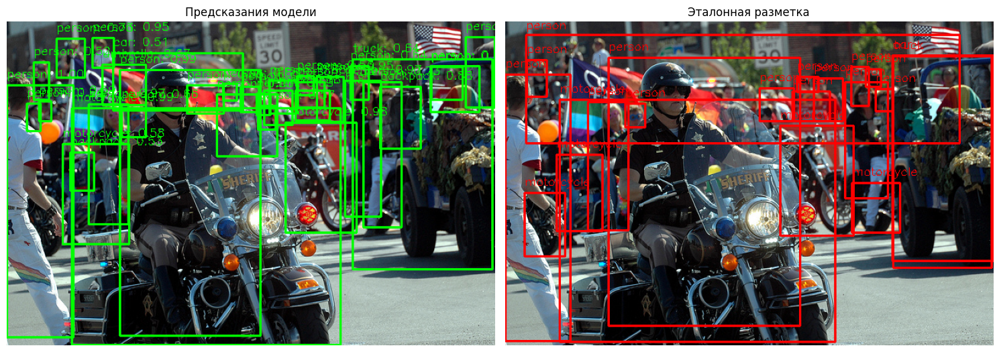

Средние значения: IoU: 0.253, Precision: 0.371, Recall: 0.290
Найдено объектов: 35
Классы прогнозов: ['person', 'motorcycle', 'person', 'motorcycle', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'backpack', 'person', 'person', 'person', 'person', 'person', 'person', 'umbrella', 'person', 'person', 'truck', 'person', 'person', 'person', 'person', 'person', 'motorcycle', 'person', 'person', 'person', 'person', 'backpack', 'person', 'car']
Истинных объектов: 21
Классы разметки: ['car', 'motorcycle', 'motorcycle', 'motorcycle', 'truck', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'motorcycle', 'motorcycle', 'person', 'person', 'person']

--- Просмотр изображения 17/20 ---
Изображение: 000000319721.jpg


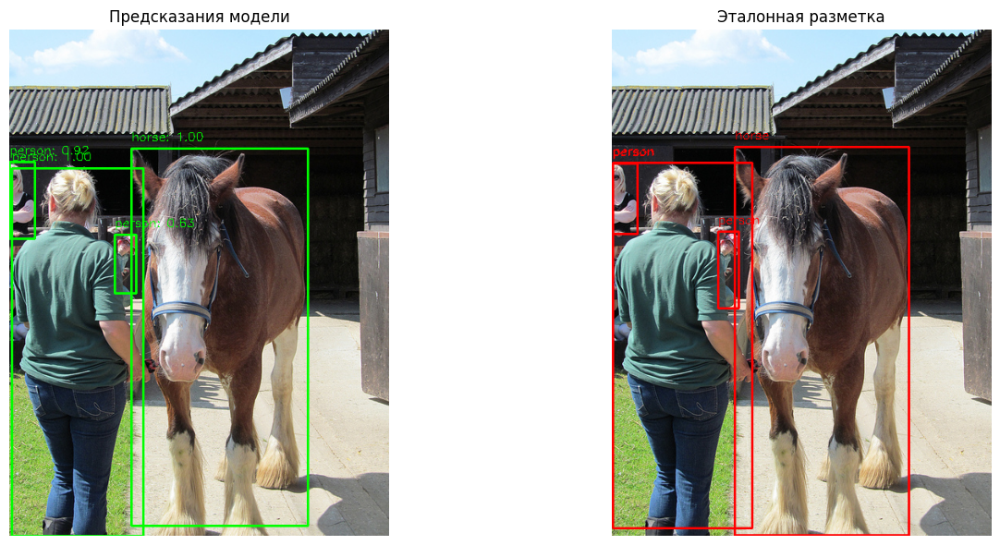

Средние значения: IoU: 0.903, Precision: 0.951, Recall: 0.947
Найдено объектов: 4
Классы прогнозов: ['person', 'horse', 'person', 'person']
Истинных объектов: 4
Классы разметки: ['horse', 'person', 'person', 'person']

--- Просмотр изображения 18/20 ---
Изображение: 000000168593.jpg


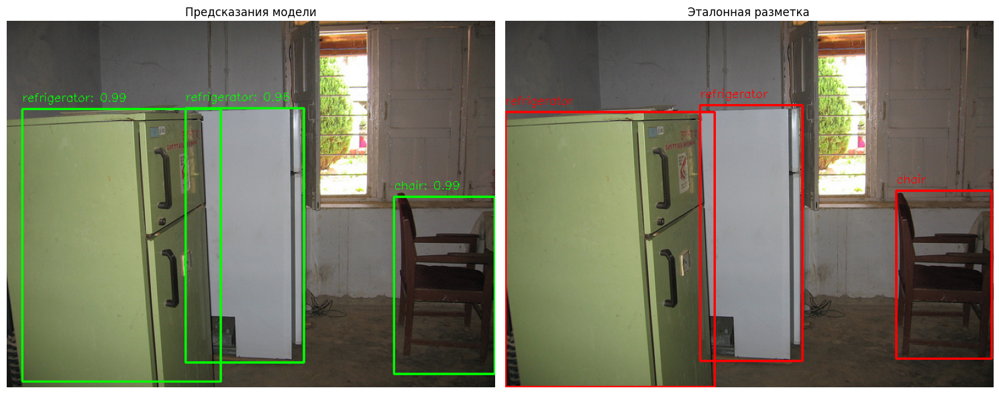

Средние значения: IoU: 0.905, Precision: 0.949, Recall: 0.952
Найдено объектов: 3
Классы прогнозов: ['chair', 'refrigerator', 'refrigerator']
Истинных объектов: 3
Классы разметки: ['chair', 'refrigerator', 'refrigerator']

--- Просмотр изображения 19/20 ---
Изображение: 000000258911.jpg


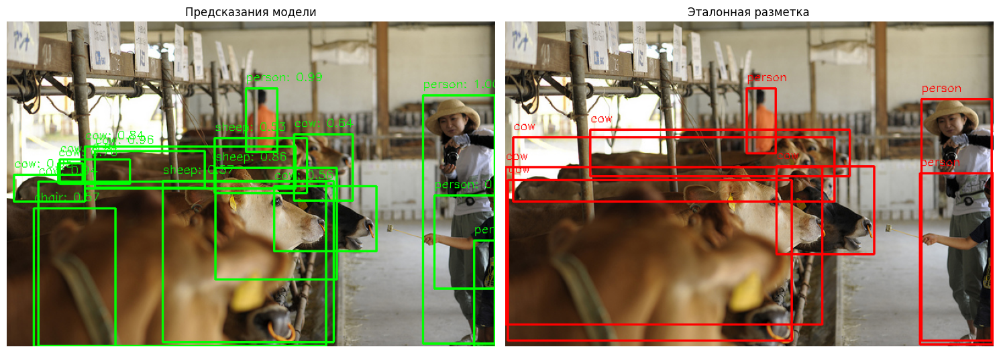

Средние значения: IoU: 0.000, Precision: 0.007, Recall: 0.000
Найдено объектов: 16
Классы прогнозов: ['person', 'person', 'cow', 'cow', 'cow', 'sheep', 'cow', 'cow', 'cow', 'cow', 'person', 'sheep', 'chair', 'cow', 'person', 'sheep']
Истинных объектов: 8
Классы разметки: ['cow', 'cow', 'cow', 'cow', 'cow', 'person', 'person', 'person']

--- Просмотр изображения 20/20 ---
Изображение: 000000166478.jpg


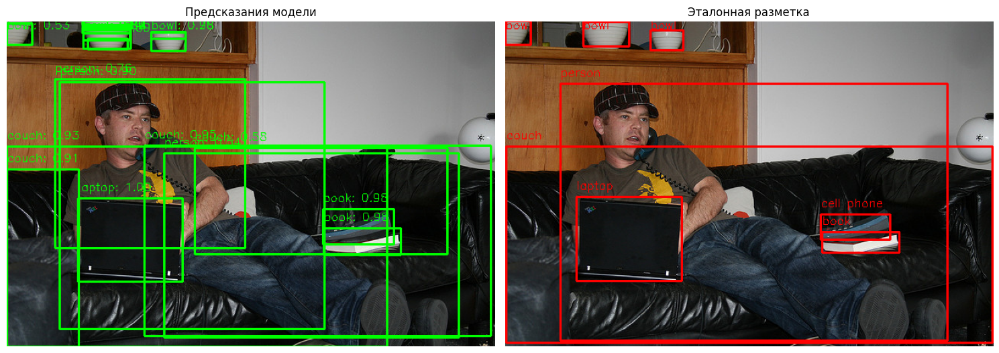

Средние значения: IoU: 0.167, Precision: 0.216, Recall: 0.240
Найдено объектов: 19
Классы прогнозов: ['laptop', 'book', 'book', 'bowl', 'couch', 'couch', 'couch', 'person', 'bowl', 'bowl', 'bowl', 'bowl', 'person', 'bowl', 'bowl', 'bowl', 'couch', 'person', 'bowl']
Истинных объектов: 8
Классы разметки: ['couch', 'cell phone', 'person', 'bowl', 'bowl', 'bowl', 'laptop', 'book']

ОБЩАЯ СТАТИСТИКА ПО 20 ИЗОБРАЖЕНИЯМ
Средний IoU: 0.529 (±0.390)
Медиана IoU: 0.688
Мин IoU: 0.000, Макс IoU: 0.953
Средняя Precision: 0.658 (±0.398)
Средняя Recall: 0.619 (±0.413)
Всего подсчетов: 51 IoU, 51 Precision, 51 Recall


In [14]:
# Наборы для сохранения метрик
total_iou = []
total_precision = []
total_recall = []

# Формирование словаря категорий COCO
coco_categories = coco.loadCats(coco.getCatIds())
category_dict = {cat['id']: cat['name'] for cat in coco_categories}
category_names = [cat['name'] for cat in coco_categories]

print(f"Обработано категорий: {len(category_dict)}")
print(f"Начальные категории: {list(category_dict.items())[:5]}")

# Проверка на 20 изображениях
for num, current_id in enumerate(chosen_img_ids[:20]):
    print(f"\n--- Просмотр изображения {num+1}/20 ---")

    # Сведения об изображении
    img_info = coco.loadImgs(current_id)[0]
    file_path = os.path.join(img_folder, img_info['file_name'])

    print(f"Изображение: {img_info['file_name']}")

    # Подготовка изображения
    tensor_img, orig_img = prepare_image(file_path)

    # Получение прогнозов
    results = obtain_predictions(model, tensor_img, device)
    filtered_results = filter_results(results, conf_threshold=0.5)

    # Загрузка разметки
    true_masks, true_boxes, true_categories = obtain_ground_truth_masks(coco, current_id)

    # Сравнительная визуализация
    display_comparison(orig_img, filtered_results, true_masks, true_boxes, true_categories)

    # Подсчет метрик для этого изображения
    img_iou = []
    img_precision = []
    img_recall = []

    if len(filtered_results['masks']) > 0 and len(true_masks) > 0:
        # Сопоставление масок прогноза и истинных
        for p_idx in range(min(3, len(filtered_results['masks']))):  # Для ускорения
            pred_mask = filtered_results['masks'][p_idx].cpu().numpy().squeeze()
            bin_mask = (pred_mask > 0.5).astype(np.uint8)

            # Поиск наилучшего соответствия
            max_iou = 0
            max_precision = 0
            max_recall = 0

            for t_idx in range(min(3, len(true_masks))):  # Для ускорения
                true_mask = true_masks[t_idx]

                # Подсчет IoU
                iou_val = compute_iou(bin_mask, true_mask)
                if iou_val > max_iou:
                    max_iou = iou_val

                # Подсчет Precision и Recall
                y_true = true_mask.flatten()
                y_pred = bin_mask.flatten()

                if len(np.unique(y_true)) > 1:  # Есть и объект и фон
                    prec_val = precision_score(y_true, y_pred, zero_division=0)
                    rec_val = recall_score(y_true, y_pred, zero_division=0)

                    if prec_val + rec_val > max_precision + max_recall:
                        max_precision = prec_val
                        max_recall = rec_val

            if max_iou > 0:
                img_iou.append(max_iou)
            if max_precision > 0:
                img_precision.append(max_precision)
            if max_recall > 0:
                img_recall.append(max_recall)

    # Добавление средних значений в общие наборы
    if img_iou:
        total_iou.extend(img_iou)
        mean_iou = np.mean(img_iou)
    else:
        mean_iou = 0

    if img_precision:
        total_precision.extend(img_precision)
        mean_precision = np.mean(img_precision)
    else:
        mean_precision = 0

    if img_recall:
        total_recall.extend(img_recall)
        mean_recall = np.mean(img_recall)
    else:
        mean_recall = 0

    print(f"Средние значения: IoU: {mean_iou:.3f}, Precision: {mean_precision:.3f}, Recall: {mean_recall:.3f}")

    # Сведения о найденных объектах
    pred_names = [get_class_name(label, category_dict) for label in filtered_results['labels'].cpu().numpy()]
    true_names = [get_class_name(cat_id, category_dict) for cat_id in true_categories]

    print(f"Найдено объектов: {len(filtered_results['boxes'])}")
    if pred_names:
        print(f"Классы прогнозов: {pred_names}")
    print(f"Истинных объектов: {len(true_boxes)}")
    if true_names:
        print(f"Классы разметки: {true_names}")

# Итоговая статистика
print("\n" + "="*50)
print("ОБЩАЯ СТАТИСТИКА ПО 20 ИЗОБРАЖЕНИЯМ")
print("="*50)

if total_iou:
    print(f"Средний IoU: {np.mean(total_iou):.3f} (±{np.std(total_iou):.3f})")
    print(f"Медиана IoU: {np.median(total_iou):.3f}")
    print(f"Мин IoU: {np.min(total_iou):.3f}, Макс IoU: {np.max(total_iou):.3f}")
else:
    print("IoU: нет сведений")

if total_precision:
    print(f"Средняя Precision: {np.mean(total_precision):.3f} (±{np.std(total_precision):.3f})")
else:
    print("Precision: нет сведений")

if total_recall:
    print(f"Средняя Recall: {np.mean(total_recall):.3f} (±{np.std(total_recall):.3f})")
else:
    print("Recall: нет сведений")

print(f"Всего подсчетов: {len(total_iou)} IoU, {len(total_precision)} Precision, {len(total_recall)} Recall")

#### 2.6 Исследование параметров маски и confidence

Проведите серию экспериментов: протестируйте разные значения mask_threshold (0.3, 0.5, 0.7), протестируйте разные значения confidence_threshold, найдите оптимальное значение, при котором достигается лучший баланс между точностью и полнотой:


In [16]:
def check_threshold_combinations(confidence_options, mask_options):
    """Тестирование комбинаций порогов для настройки модели"""
    collected_results = []

    # Перебираем все комбинации порогов
    for confidence in confidence_options:
        for mask in mask_options:
            print(f"Тест: confidence={confidence}, mask={mask}")

            # Метрики для текущей комбинации
            iou_metrics = []
            precision_metrics = []
            recall_metrics = []
            detection_counts = []

            # Обрабатываем три изображения
            for img_identifier in chosen_img_ids[:3]:
                # Загружаем данные изображения
                img_info = coco.loadImgs(img_identifier)[0]
                path_to_image = os.path.join(img_folder, img_info['file_name'])

                # Подготавливаем изображение
                image_tensor, _ = prepare_image(path_to_image)
                # Получаем предсказания
                model_predictions = obtain_predictions(model, image_tensor, device)
                # Фильтруем по порогу уверенности
                filtered_data = filter_results(model_predictions, confidence)

                # Получаем эталонные данные
                reference_masks, _, _ = obtain_ground_truth_masks(coco, img_identifier)

                # Записываем количество обнаружений
                detection_counts.append(len(filtered_data['boxes']))

                # Сравниваем маски при их наличии
                if len(filtered_data['masks']) > 0 and len(reference_masks) > 0:
                    # Берем первую маску для сравнения
                    predicted_mask = filtered_data['masks'][0].cpu().numpy().squeeze()
                    processed_mask = (predicted_mask > mask).astype(np.uint8)
                    reference_mask = reference_masks[0]

                    # Считаем пересечение
                    iou_metric = compute_iou(processed_mask, reference_mask)
                    iou_metrics.append(iou_metric)

                    # Считаем точность и полноту
                    ground_truth_pixels = reference_mask.flatten()
                    predicted_pixels = processed_mask.flatten()

                    if len(np.unique(ground_truth_pixels)) > 1:
                        precision_metric = precision_score(ground_truth_pixels, predicted_pixels, zero_division=0)
                        recall_metric = recall_score(ground_truth_pixels, predicted_pixels, zero_division=0)
                        precision_metrics.append(precision_metric)
                        recall_metrics.append(recall_metric)

            # Анализируем собранные данные
            if iou_metrics:
                average_iou = np.mean(iou_metrics)
                average_precision = np.mean(precision_metrics) if precision_metrics else 0
                average_recall = np.mean(recall_metrics) if recall_metrics else 0
                average_detections = np.mean(detection_counts)

                # Сохраняем результаты
                result_entry = {
                    'confidence': confidence,
                    'mask': mask,
                    'average_iou': average_iou,
                    'average_precision': average_precision,
                    'average_recall': average_recall,
                    'average_detections': average_detections
                }
                collected_results.append(result_entry)

                print(f"Показатели: IoU={average_iou:.3f}, Precision={average_precision:.3f}, "
                      f"Recall={average_recall:.3f}, Detections={average_detections:.1f}")
            else:
                print("Недостаточно данных для анализа")

    return collected_results

# Определяем тестируемые пороги
confidence_range = [0.3, 0.5, 0.7]
mask_range = [0.3, 0.5, 0.7]

print("Запуск тестирования различных порогов...")
final_results = check_threshold_combinations(confidence_range, mask_range)

# Выводим итоговую таблицу
print("\n" + "="*65)
print("РЕЗУЛЬТАТЫ ТЕСТИРОВАНИЯ ПОРОГОВЫХ ЗНАЧЕНИЙ")
print("="*65)
print("Confidence | Mask | IoU     | Precision | Recall   | Найдено")
print("-" * 65)

for entry in final_results:
    print(f"{entry['confidence']:10.1f} | {entry['mask']:4.1f} | "
          f"{entry['average_iou']:7.3f} | {entry['average_precision']:9.3f} | "
          f"{entry['average_recall']:8.3f} | {entry['average_detections']:8.1f}")

# Определяем оптимальные настройки
if final_results:
    # Максимальный IoU
    best_iou_config = max(final_results, key=lambda x: x['average_iou'])
    # Сбалансированная точность и полнота
    best_balanced_config = max(final_results, key=lambda x: x['average_precision'] + x['average_recall'])

    print(f"\nОптимальные настройки:")
    print(f"Лучший IoU: confidence={best_iou_config['confidence']}, mask={best_iou_config['mask']}")
    print(f"Лучший баланс: confidence={best_balanced_config['confidence']}, mask={best_balanced_config['mask']}")

Запуск тестирования различных порогов...
Тест: confidence=0.3, mask=0.3
Показатели: IoU=0.305, Precision=0.316, Recall=0.321, Detections=15.3
Тест: confidence=0.3, mask=0.5
Показатели: IoU=0.309, Precision=0.330, Recall=0.312, Detections=15.3
Тест: confidence=0.3, mask=0.7
Показатели: IoU=0.291, Precision=0.333, Recall=0.292, Detections=15.3
Тест: confidence=0.5, mask=0.3
Показатели: IoU=0.305, Precision=0.316, Recall=0.321, Detections=12.7
Тест: confidence=0.5, mask=0.5
Показатели: IoU=0.309, Precision=0.330, Recall=0.312, Detections=12.7
Тест: confidence=0.5, mask=0.7
Показатели: IoU=0.291, Precision=0.333, Recall=0.292, Detections=12.7
Тест: confidence=0.7, mask=0.3
Показатели: IoU=0.305, Precision=0.316, Recall=0.321, Detections=11.0
Тест: confidence=0.7, mask=0.5
Показатели: IoU=0.309, Precision=0.330, Recall=0.312, Detections=11.0
Тест: confidence=0.7, mask=0.7
Показатели: IoU=0.291, Precision=0.333, Recall=0.292, Detections=11.0

РЕЗУЛЬТАТЫ ТЕСТИРОВАНИЯ ПОРОГОВЫХ ЗНАЧЕНИЙ
Confid